# 1.选择一个数据集

shape of moons: (10000, 2)


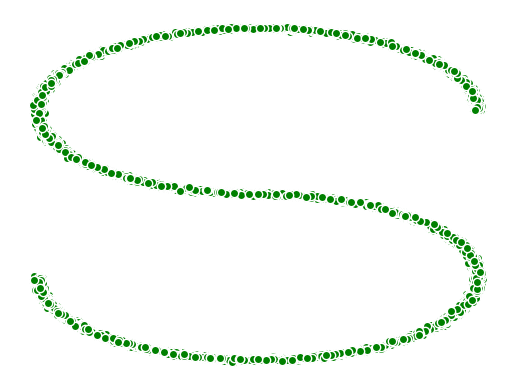

In [228]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
from sklearn.datasets import make_s_curve
import torch
from torch import nn

s_curve, _ = make_s_curve(10**4, noise=0.01)
s_curve = s_curve[:, [0, 2]] / 10.0
print("shape of moons:", s_curve.shape)

data = s_curve.T
fig, ax = plt.subplots()
ax.scatter(*data, color='green', edgecolor='white')
ax.axis('off')
dataset = torch.Tensor(s_curve).float()

# 2.确定超参数的值

In [229]:
num_steps = 100  # 扩散步数可以由beta、分布均值和方差共同决定

# 制定每一步的beta
betas = torch.linspace(-6, 6, num_steps)
betas = torch.sigmoid(betas) * (0.5e-2 - 1e-5) + 1e-5

# 计算alpha相关参数
alphas = 1 - betas
alphas_prod = torch.cumprod(alphas, 0)  # cumprod计算累乘t时刻的alpha(ba)
alphas_prod_p = torch.cat([torch.tensor([1]).float(), alphas_prod[: -1]], 0)  # p代表previous
alphas_prod_sqrt = torch.sqrt(alphas_prod)
one_minus_alphas_prod_log = torch.log(1 - alphas_prod)
one_minus_alphas_prod_sqrt = torch.sqrt(1 - alphas_prod)

assert alphas.shape == alphas_prod.shape == alphas_prod_p.shape == alphas_prod_sqrt.shape == one_minus_alphas_prod_log.shape == one_minus_alphas_prod_sqrt.shape == betas.shape
print("all the same shape:", betas.shape)

all the same shape: torch.Size([100])


# 3.确定扩散过程任意时刻的采样值

In [230]:
# 基于x_0和参数重整化技巧，计算任意时刻x的采样值
def q_x(x_0, t):
    noise = torch.randn_like(x_0)  # 从正态分布中采样随机噪声
    alphas_t = alphas_prod_sqrt[t]  # 乘上x_0即为均值
    alphas_l_m_t = one_minus_alphas_prod_sqrt[t]  # 标准差
    return alphas_t * x_0 + alphas_l_m_t * noise  # 参数重整化，在均值基础上，加上标准差*噪声得到x_t

# 4.扩散过程演示

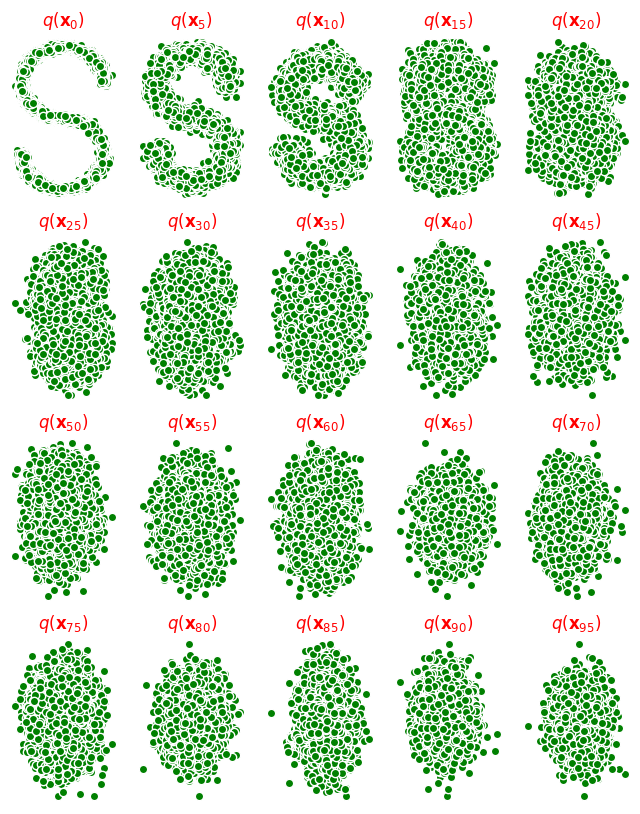

In [231]:
num_shows = 20
fig, axs = plt.subplots(4, 5, figsize=(8, 10))
plt.rc('text', color='blue')

# 生成20张图，每张图间隔五次扩散
for i in range(num_shows):
    j = i // 5
    k = i % 5
    q_i = q_x(dataset, i * num_steps // num_shows)
    axs[j, k].scatter(q_i[:, 0], q_i[:, 1], color='green',edgecolor='white')
    axs[j, k].set_axis_off()
    axs[j, k].set_title('$q(\mathbf{x}_{'+str(i*num_steps//num_shows)+'})$', color='red')

# 5.拟合反向过程高斯分布模型

In [232]:
class MLPDiffusion(nn.Module):
    def __init__(self, n_steps, num_units=128):
        super(MLPDiffusion, self).__init__()

        self.linears = nn.Sequential(
            nn.Linear(2, num_units), nn.ReLU(),
            nn.Linear(num_units, num_units), nn.ReLU(),
            nn.Linear(num_units, num_units), nn.ReLU(),
            nn.Linear(num_units, 2)
        )
        self.step_embeddings = nn.Sequential(
            nn.Embedding(n_steps, num_units),
            nn.Embedding(n_steps, num_units),
            nn.Embedding(n_steps, num_units)
        )

    def forward(self, x, t):
        for idx, embedding_layer in enumerate(self.step_embeddings):
            t_embedding = embedding_layer(t)
            x = self.linears[2 * idx](x)
            x += t_embedding
            x = self.linears[2 * idx + 1](x)
        x = self.linears[-1](x)
        return x

# 6.训练的误差函数

In [233]:
def diffusion_loss_fn(model, x_0, alphas_prod_sqrt, one_minus_alphas_prod_sqrt, num_steps):
    """对任意t时刻进行采样计算loss"""
    batch_size = x_0.shape[0]

    # t = torch.randint(0, num_steps, size=(batch_size//2, ))
    # t = torch.cat([t, num_steps - 1 - t], dim=0)  # [batch_size]
    t = torch.randint(0, num_steps, size=(batch_size,))
    t = t.unsqueeze(-1)  # 在最后一维添加一个维度，变为[batch_size, 1]

    a = alphas_prod_sqrt[t]
    am1 = one_minus_alphas_prod_sqrt[t]
    e = torch.randn_like(x_0)
    x = x_0 * a + e * am1
    output = model(x, t.squeeze(-1))
    return (e - output).square().mean()

# 7.反向过程采样函数

In [234]:
def p_sample(model, x, t, betas, one_minus_alphas_prod_sqrt):
    t = torch.tensor([t])
    coeff = betas[t] / one_minus_alphas_prod_sqrt[t]
    eps_theta = model(x, t)
    mean = (1 / (1 - betas[t]).sqrt()) * (x - (coeff * eps_theta))
    z = torch.randn_like(x)
    sigma_t = betas[t].sqrt()
    sample = mean + sigma_t * z
    return sample


def p_sample_loop(model, shape, num_steps, betas, one_minus_alphas_prod_sqrt):
    """从x_T逐渐恢复到x_0"""
    cur_x = torch.randn(shape)
    x_seq = [cur_x]
    for i in reversed(range(num_steps)):
        cur_x = p_sample(model, cur_x, i, betas, one_minus_alphas_prod_sqrt)
        x_seq.append(cur_x)
    return x_seq

# 8.训练模型

tensor(0.5339, grad_fn=<MeanBackward0>)
tensor(0.1975, grad_fn=<MeanBackward0>)
tensor(0.2761, grad_fn=<MeanBackward0>)
tensor(0.4006, grad_fn=<MeanBackward0>)
tensor(0.2219, grad_fn=<MeanBackward0>)
tensor(0.2489, grad_fn=<MeanBackward0>)
tensor(0.3357, grad_fn=<MeanBackward0>)
tensor(0.2928, grad_fn=<MeanBackward0>)
tensor(0.3789, grad_fn=<MeanBackward0>)
tensor(0.2340, grad_fn=<MeanBackward0>)
tensor(0.5177, grad_fn=<MeanBackward0>)
tensor(0.3254, grad_fn=<MeanBackward0>)
tensor(0.2736, grad_fn=<MeanBackward0>)
tensor(0.3105, grad_fn=<MeanBackward0>)
tensor(0.2373, grad_fn=<MeanBackward0>)
tensor(0.3587, grad_fn=<MeanBackward0>)
tensor(0.2271, grad_fn=<MeanBackward0>)
tensor(0.3909, grad_fn=<MeanBackward0>)
tensor(0.5761, grad_fn=<MeanBackward0>)
tensor(0.2167, grad_fn=<MeanBackward0>)
tensor(0.3796, grad_fn=<MeanBackward0>)


C:\Users\Curisy\AppData\Local\Temp\ipykernel_16000\420950848.py:40: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(1, 10, figsize=(30, 3))


tensor(0.2355, grad_fn=<MeanBackward0>)
tensor(0.2335, grad_fn=<MeanBackward0>)
tensor(0.5451, grad_fn=<MeanBackward0>)
tensor(0.1120, grad_fn=<MeanBackward0>)
tensor(0.2336, grad_fn=<MeanBackward0>)
tensor(0.3581, grad_fn=<MeanBackward0>)
tensor(0.1853, grad_fn=<MeanBackward0>)
tensor(0.6678, grad_fn=<MeanBackward0>)
tensor(0.9074, grad_fn=<MeanBackward0>)
tensor(0.1336, grad_fn=<MeanBackward0>)
tensor(0.1734, grad_fn=<MeanBackward0>)
tensor(0.3055, grad_fn=<MeanBackward0>)
tensor(0.2922, grad_fn=<MeanBackward0>)
tensor(0.4211, grad_fn=<MeanBackward0>)
tensor(0.3066, grad_fn=<MeanBackward0>)
tensor(0.3049, grad_fn=<MeanBackward0>)
tensor(0.3142, grad_fn=<MeanBackward0>)
tensor(0.2245, grad_fn=<MeanBackward0>)
tensor(0.1717, grad_fn=<MeanBackward0>)


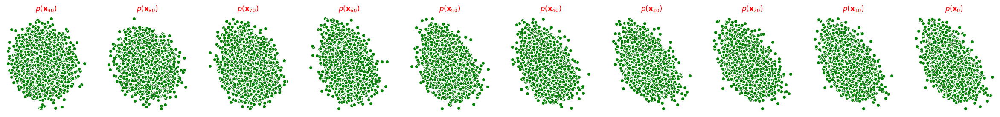

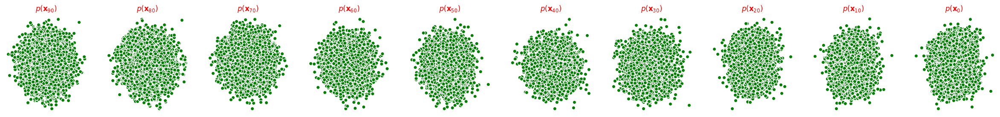

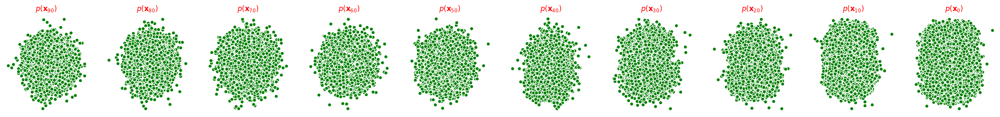

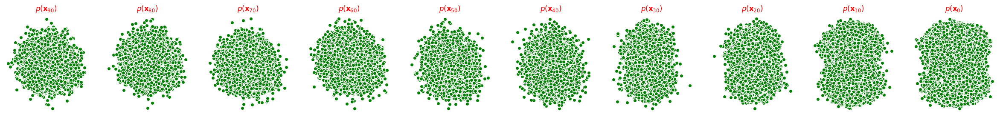

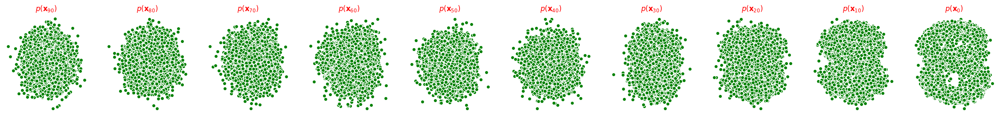

...

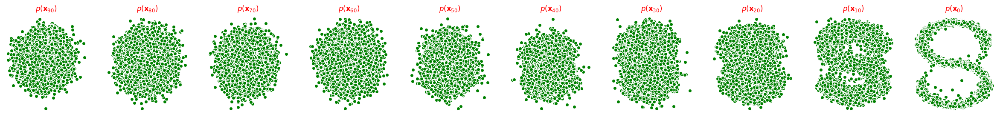

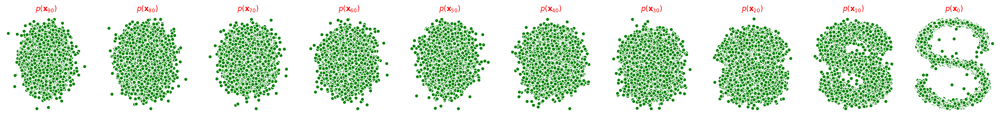

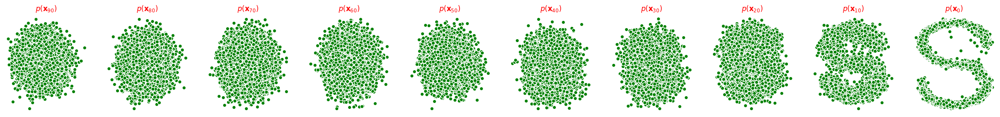

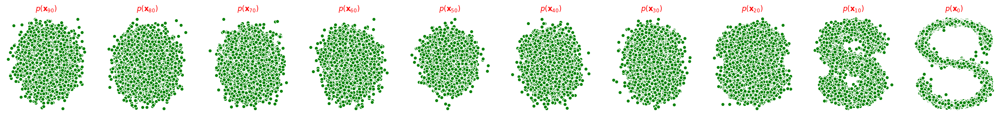

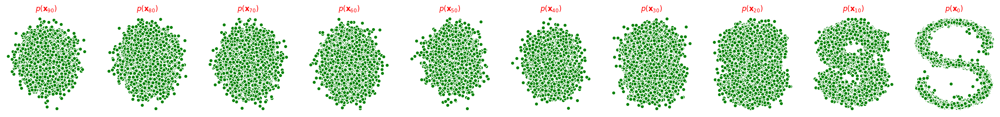

In [235]:



seed = 9505

class EMA():
    """构建一个参数平滑器"""
    def __init__(self, mu=0.01):
        self.mu = mu
        self.shadow = {}

    def register(self, name, val):
        self.shadow[name] = val.clone()

    def __call__(self, name, x):
        assert name in self.shadow
        new_average = self.mu * x + (1.0 - self.mu) * self.shadow[name]
        self.shadow[name] = new_average.clone()
        return new_average


batch_size = 128
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=True)
epochs = 4000
plt.rc('text', color='red')

model = MLPDiffusion(num_steps)


optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

for i in range(epochs):
    for idx, batch_x in enumerate(dataloader):
        loss = diffusion_loss_fn(model, batch_x, alphas_prod_sqrt, one_minus_alphas_prod_sqrt, num_steps)
        optimizer.zero_grad()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.)  # 防止梯度爆炸
        optimizer.step()

    if i % 100 == 0:
        print(loss)
        x_seq = p_sample_loop(model, dataset.shape, num_steps, betas, one_minus_alphas_prod_sqrt)
        fig, axs = plt.subplots(1, 10, figsize=(30, 3))
        for j in range(1, 11):
            cur_x = x_seq[j * 10].detach()
            axs[j - 1].scatter(cur_x[:, 0], cur_x[:, 1], color='green', edgecolor='white')
            axs[j - 1].set_axis_off()
            axs[j - 1].set_title('$p(\mathbf{x}_{'+str(100 - j * 10)+'})$', color='red')

# 9.动画演示

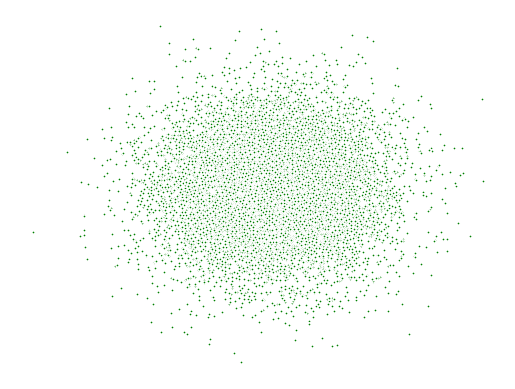

In [238]:
import io
from PIL import Image

imgs = []
for i in range(100):
    plt.clf()
    q_i = q_x(dataset, torch.tensor([i]))
    plt.scatter(q_i[:, 0], q_i[:, 1], color='green', edgecolors='white', s=5)
    plt.axis('off')

    img_buf = io.BytesIO()
    plt.savefig(img_buf, format='png')
    img = Image.open(img_buf)
    imgs.append(img)

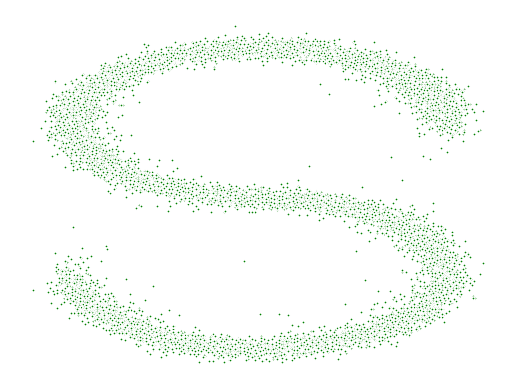

In [239]:
reverse = []
for i in range(100):
    plt.clf()
    cur_x = x_seq[i].detach()
    plt.scatter(cur_x[:, 0], cur_x[:, 1], color='green', edgecolors='white', s=5)
    plt.axis('off')

    img_buf = io.BytesIO()
    plt.savefig(img_buf, format='png')
    img = Image.open(img_buf)
    imgs.append(img)

In [240]:
imgs = imgs + reverse
imgs[0].save("diffusion.gif", format='GIF', append_images=imgs, save_all=True, duration=100, loop=0)